In [1]:
# import packages
import os
import random
import time

# external
import numpy as np
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import image

import warnings
warnings.filterwarnings('ignore')

# Self-built package
from pygazeplot.gazeplotter import *

In [2]:
LOGFILENAME = 'sample'
# be used to determine where to store and retrieve data files
DIR = os.path.dirname('C:\\Users\\Chloe\\Documents\\Capstone\\')

In [3]:
# the DATADIR is the path to the directory where data files will be stored
DATADIR = os.path.join(DIR, 'data')
# the IMGDIR is the path to the directory that contains the image files
IMGDIR = os.path.join(DIR, 'images')
# path to logfile establishes where the gaze data will be written
LOGFILE = os.path.join(DATADIR, LOGFILENAME)



# DISPLAY
# the DISPSIZE is the monitor resolution, e.g. (1024,768)
DISPSIZE = (1920,1080) #(2880, 1800) #(1024,768)

# the SCREENDIST is the distance in centimeters between the participant and the
# display
SCREENDIST = 60.0
# BGC is for BackGroundColour, FGC for ForeGroundColour; both are RGB guns,
# which contain three values between 0 and 255, representing the intensity of
# Red, Green, and Blue respectively, e.g. (0,0,0) for black, (255,255,255) for
# white, or (255,0,0) for the brightest red
BGC = (0,0,0)
#BGC = (255,255,255)
FGC = (255,255,255)

TEXTSIZE = 12

In [4]:
DATAPATH = os.path.join(DATADIR, LOGFILENAME + '.tsv')
LOGPATH = os.path.join(DATADIR, LOGFILENAME + '_log.txt')

# Read log and data
df = pd.read_csv(DATAPATH,sep='\t')
with open(LOGPATH) as f:
    log = f.readlines()

In [5]:
for l in log:
    if l.startswith('distance between participant and display'):
        distance = l.strip('distance between participant and display: ').strip(' cm\n')
        print(l)
    if l.startswith('IMAGENAME'):
        image_name = l.strip('IMAGENAME ').strip('\n') 

distance between participant and display: 57.0 cm



In [6]:
def trim_edge(data, edgex=0, edgey=0, filepath=None):
    """ remove points of gaze at the screen edges because 
        they are not likely to contain useful information.
    
    Arguments:
    data         data collected from a single trial, as a dataframe
    edgex        pixels of horizontal edge (default = 0)
    edgey        pixels of vertical edge (default = 0)
    filepath     (optional) full path to the file in which the heatmap should be
                 saved, or None to not save the file (default = None) 
    
    Returns:
    data         trimmed data, as a dataframe 
    
    """
    w, h = (DISPSIZE[0]-1280)//2, (DISPSIZE[1]-1024)//2
    data['FPOGX'] = data['FPOGX']*1280+w
    data['FPOGY'] = data['FPOGY']*1024+h
    data = data[data['FPOGX']>edgex]
    data = data[data['FPOGX']<DISPSIZE[0]-edgex]
    data = data[data['FPOGY']>edgey]
    data = data[data['FPOGY']<DISPSIZE[1]-edgey]
    
    if filepath:
        data.to_csv(filepath)
    return data

In [7]:
TRIMMED = os.path.join(DATADIR, LOGFILENAME + '_trimmed.csv')
data = trim_edge(df, edgex=50, edgey=50, filepath=TRIMMED)
data

,CNT,TIME,TIME_TICK,FPOGX,FPOGY,FPOGS,FPOGD,FPOGID,FPOGV,LPOGX,...,LPUPILV,REYEX,REYEY,REYEZ,RPUPILD,RPUPILV,CX,CY,CS,USER
1,224430,3688.83984,1203285619107,1001.3824,990.25280,3688.03467,0.09863,1754,0,1.10823,...,1,0.04510,-0.01172,0.85617,0.00346,1,0.32292,0.26019,0,0
5,224434,3688.90552,1203286276596,871.2960,687.98848,3688.03467,0.09863,1754,0,1.10823,...,1,0.04510,-0.01172,0.85617,0.00344,1,0.32292,0.26019,0,0
6,224435,3688.92188,1203286440655,937.3056,921.63456,3688.03467,0.09863,1754,0,1.10823,...,1,0.04510,-0.01172,0.85617,0.00354,1,0.32292,0.26019,0,0
76,224505,3690.07178,1203297939332,465.6256,980.80128,3689.69385,0.13159,1756,0,2.49145,...,1,0.04510,-0.01172,0.85617,0.00339,1,0.32292,0.26019,0,0
83,224512,3690.18677,1203299090623,1151.0784,985.18400,3689.69385,0.13159,1756,0,2.49145,...,1,0.05387,-0.00652,0.77240,0.00284,1,0.32292,0.26019,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3896,228387,3753.84912,1203935713616,1119.4752,733.89440,3753.33301,0.30225,1917,0,0.47920,...,1,0.13716,-0.07542,1.07984,0.00661,0,0.32292,0.26019,0,IMAGE OFFLINE AT 156576
3897,228388,3753.84961,1203935718040,1137.4976,725.03680,3753.33301,0.30225,1917,0,0.47920,...,1,0.13716,-0.07542,1.07984,0.00661,0,0.32292,0.26019,0,TRIALEND 1
3898,228389,3753.88232,1203936045505,1100.1984,742.41408,3753.33301,0.30225,1917,0,0.54097,...,1,0.13716,-0.07542,1.07984,0.00662,0,0.32292,0.26019,0,TRIALEND 1
3899,228390,3753.88306,1203936051199,1081.5488,751.10784,3753.84912,0.03394,1918,1,0.54097,...,1,0.13716,-0.07542,1.07984,0.00662,0,0.32292,0.26019,0,TRIALEND 1


In [8]:
#data.loc[:, 'USER']

In [9]:
PLOTDIR = os.path.join(DIR, 'plots')
HPATH = os.path.join(PLOTDIR, LOGFILENAME+'_heatmap.png')
FPATH = os.path.join(PLOTDIR, LOGFILENAME+'_fixations.png')
SPATH = os.path.join(PLOTDIR, LOGFILENAME+'_scanpath.png')

In [10]:
imagefile = os.path.join(IMGDIR, image_name)

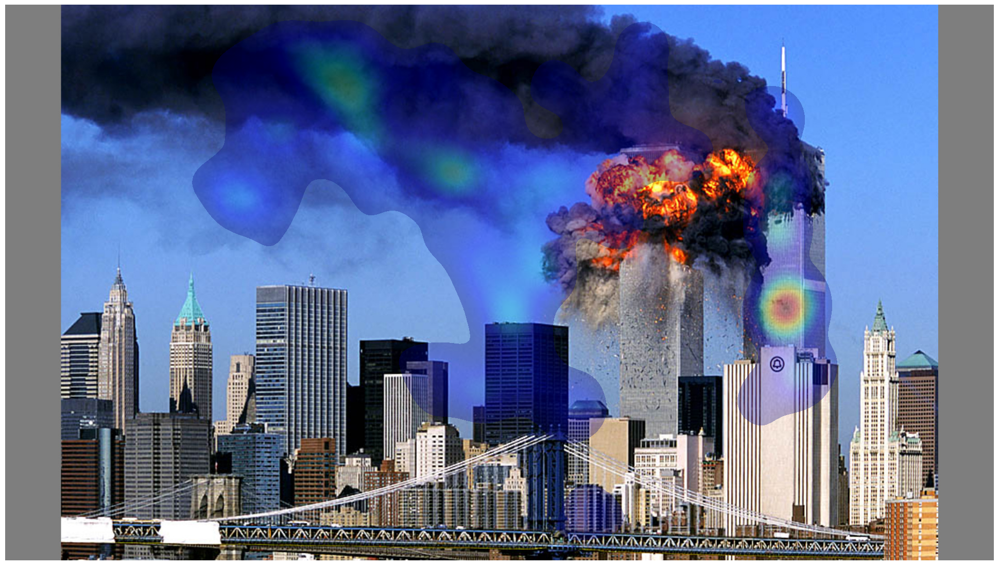

In [11]:
fig = draw_heatmap(data, dispsize=(1920,1080), imagefile=imagefile, durationweight=True, alpha=0.3, savefilename=HPATH)

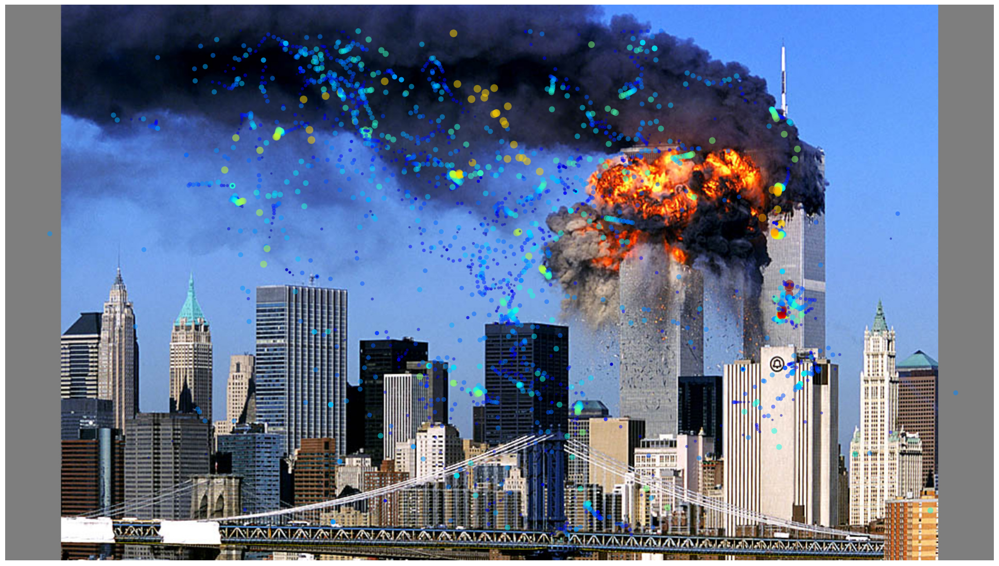

In [12]:
fig = draw_fixations(data, dispsize=(1920,1080), imagefile=imagefile, durationsize=True, durationcolour=True, alpha=0.5, savefilename=FPATH)

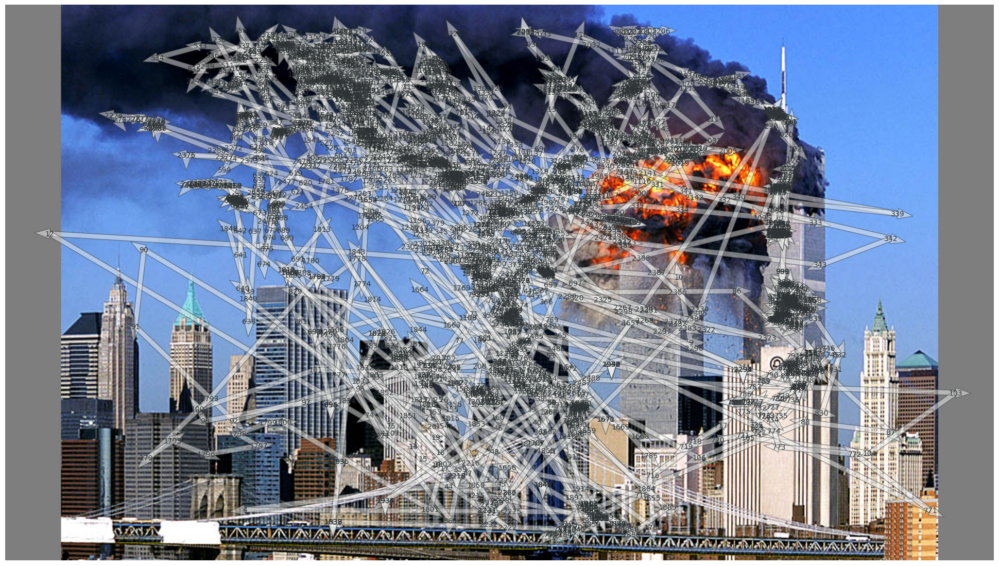

In [13]:
fig = draw_scanpath(data, dispsize=(1920,1080), imagefile=imagefile, alpha=0.5, savefilename=SPATH)